# Query the OAI database


## 1. Add `.dcm` extension
- For 18m MRI

In [20]:
import os 
import pydicom as dicom
import matplotlib.pylab as plt
from sklearn.model_selection import train_test_split
import shutil
import json
import numpy as np
from PIL import Image

In [2]:
filepath = 'OAI_all/2.D.2/'
dir_list = os.listdir(filepath)

In [3]:
date_list = []
for ID in dir_list:
    dateF = os.listdir(os.path.join(filepath, ID))
    date_list.append(dateF[0])

In [4]:
print(len(dir_list))
print(len(date_list))

287
287


In [5]:
totalpat_list = []

for i in range(len(dir_list)):
    currentPath = os.path.join(filepath, dir_list[i], date_list[i])
#     print(currentPath)
    patID_list = []

    for filename in os.listdir(currentPath):
        if os.path.isdir(os.path.join(currentPath, filename)):
            patID_list.append(filename)
    
    totalpat_list.append(patID_list)

In [6]:
print(len(totalpat_list))
totalpat_list[0]

287


['11209803',
 '11209801',
 '11209807',
 '11209805',
 '11209806',
 '11209804',
 '11209802',
 '11209808']

In [7]:
### Uncomment to change name

# for i in range(len(totalpat_list)):
#     for j in range(len(totalpat_list[i])):
#         togoPath = os.path.join(filepath, dir_list[i], date_list[i], totalpat_list[i][j])
#         for dcmIm in os.listdir(togoPath):
#             oldname = os.path.join(togoPath, dcmIm)
#             newname = os.path.join(togoPath, dcmIm+'.dcm')
#             os.rename(oldname, newname)

## 2. Reading the images

OAI_all/2.D.2/9214480/20060825/11341608
76
(384, 384)


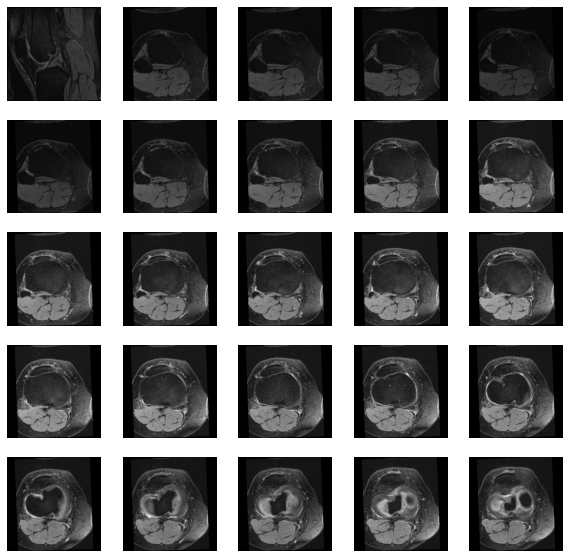

In [8]:
path_idx = 12
inpath_idx = 2

examplePath = os.path.join(filepath, dir_list[path_idx], date_list[path_idx], totalpat_list[path_idx][inpath_idx])
print(examplePath)
print(len(os.listdir(examplePath)))
# print(ds)

# ds = dicom.dcmread('OAI_all/2.D.2/9000798/20060303/10876801/008.dcm')
# print(ds)

num_subplots = 5
plt.subplots(num_subplots, num_subplots, figsize = (10, 10))

for cnt, slnum in enumerate(range(1,len(examplePath),len(examplePath)//num_subplots**2)):
    
    if cnt < num_subplots**2:
        ds = dicom.dcmread(examplePath+'/'+str(cnt+1).zfill(3)+'.dcm')
        imageArray = ds.pixel_array
    
        plt.subplot(num_subplots, num_subplots, cnt+1)
        plt.imshow(imageArray, cmap = 'gray')
        plt.axis('off')

print(imageArray.shape)

##### Comment
It is a mess... Different viewing planes? different angles, some dont even know what that is, need help in interpretation 
<br>
- 40, 0
- 40, 5
- 10, 0
- 30, 0

## 3. Extract the DESS images
- shape = (384, 384, 160)

In [1]:
dessIm_path = []

# print(len(totalpat_list))

for path_idx in range(len(totalpat_list)):
    for i in range(len(totalpat_list[path_idx])):
        examplePath = os.path.join(filepath, dir_list[path_idx], date_list[path_idx], totalpat_list[path_idx][i])
        if len(os.listdir(examplePath)) == 160:
            print(path_idx, examplePath)
            dessIm_path.append(examplePath)

In [34]:
idx = 1
dessIm_path[idx]

'OAI_all/2.D.2/9689922/20060125/10812203'

In [48]:
def visualize_dicom_images(img_path, start_index, end_index):
    nrows = 15
    ncols = 8
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*4))
    axs = axs.flatten()
    
    for i, ax in enumerate(axs):
        if start_index + i > end_index:
            break
        ds = dicom.dcmread(img_path+'/'+str(start_index+i).zfill(3)+'.dcm')
        imarray = apply_voi_lut(ds.pixel_array, ds)
        normimarray = (imarray - np.min(imarray)) / (np.max(imarray) - np.min(imarray))
        PILimage = Image.fromarray((normimarray * 255).astype(np.uint8))
        
        ax.set_title('Slice {}'.format(start_index+i), fontsize = 30)
        ax.imshow(PILimage, cmap='gray')
        ax.axis("off")
    plt.tight_layout()
    plt.show()

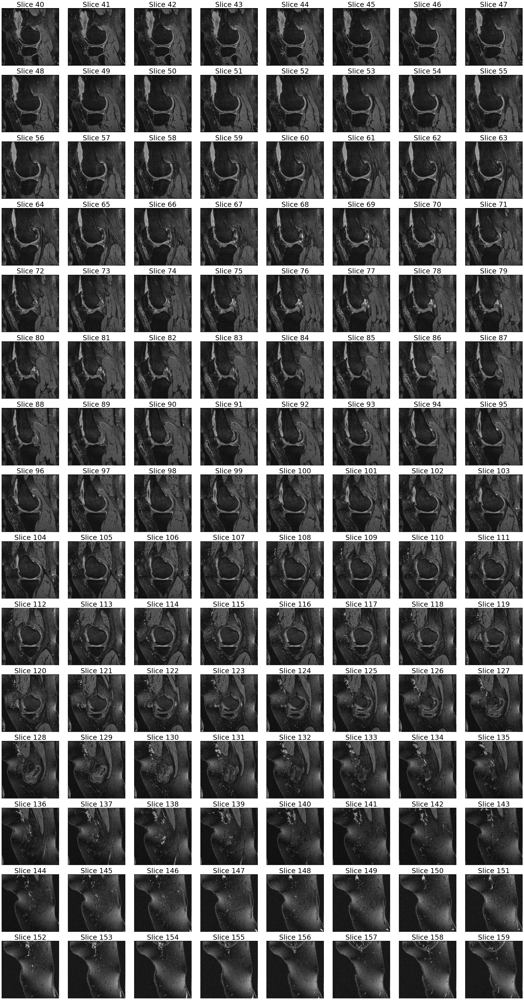

In [49]:
idx = 100
start_range = 40
end_range = 160

visualize_dicom_images(dessIm_path[idx], start_range, end_range)

In [33]:
dessIm_path[idx]

'OAI_all/2.D.2/9700341/20061228/11401803'

## 4. Train-Test-Split

in the dessIm_dir, do train-test-split => create two lists <br>
in each list: 
    - get each directory and extract Slices 50-60 and Slices 105-115
    - copy to new folder
    - rename the file img_(patIdx)_(sliceIdx).dcm
    - save new directory in new list

In [13]:
train_dirs, valid_dirs = train_test_split(dessIm_path, test_size=0.2, random_state=42)
print(len(train_dirs))
print(len(valid_dirs))

228
58


In [26]:
def extract_slices(img_dir, new_img_path, start_range, end_range):
    
    new_dirs = []
    
    # in every path within the directory list
    for i in range(len(img_dir)):
        img_path = img_dir[i]
        patID = i+1
        # find the targeted slice .dcm file
        for slice_num in range(start_range, end_range):
            ori_img_path = os.path.join(img_path, str(slice_num).zfill(3)+'.dcm')
            shutil.copy(ori_img_path, new_img_path) # move to new directory
            
            # rename the file
            old_filename = os.path.join(new_img_path, str(slice_num).zfill(3)+'.dcm')
            new_filename = os.path.join(new_img_path, 'img_'+str(patID).zfill(3)+'_'+str(slice_num).zfill(3)+'.dcm')
            os.rename(old_filename, new_filename)
            
            # append the new directory into the list
            new_dirs.append(new_filename)
            
        print('Patient ', patID, ' done')
    
    return new_dirs

In [14]:
new_train_path = 'OAI_all/2Dtrain_slices/IMAGES/'
new_valid_path = 'OAI_all/2Dvalid_slices/IMAGES/'

In [15]:
### Uncomment the following

# # extract slices 50-59 (train)
# start_range = 50
# end_range = 60
# new_train_dirs_1 = extract_slices(train_dirs, new_train_path, start_range, end_range)

In [16]:
### Uncomment the following

# # extract slices 105-114 (train)
# start_range = 105
# end_range = 115
# new_train_dirs_2 = extract_slices(train_dirs, new_train_path, start_range, end_range)

In [17]:
### Uncomment the following

# # extract slices 50-59 (valid)
# start_range = 50
# end_range = 60
# new_valid_dirs_1 = extract_slices(valid_dirs, new_valid_path, start_range, end_range)

In [18]:
### Uncomment the following

# # extract slices 50-59 (valid)
# start_range = 105
# end_range = 115
# new_valid_dirs_2 = extract_slices(valid_dirs, new_valid_path, start_range, end_range)

In [20]:
print('Checking from directory:')
print('total train images: ', len(os.listdir(new_train_path)))
print('total valid images: ', len(os.listdir(new_valid_path)))

Checking from directory:
total train images:  4561
total valid images:  1160


In [24]:
for filename in os.listdir(new_train_path):
    if not filename.startswith('img_'):
        file_path = os.path.join(new_train_path, filename)
        if os.path.isdir(file_path):
            shutil.rmtree(file_path)
        else:
            os.remove(file_path)
        print(filename, ' removed')

.ipynb_checkpoints  removed


In [25]:
print('Checking from directory:')
print('total train images: ', len(os.listdir(new_train_path)))
print('total valid images: ', len(os.listdir(new_valid_path)))

Checking from directory:
total train images:  4560
total valid images:  1160


### Make `json` file for the dataset

In [40]:
def json_make_no_label(train_img_path, valid_img_path):
    datasetDict = {}
    datasetDict["name"] = "Extracted OAI Dataset (18-month)"
    datasetDict["date"] = "11/02/2023"
    datasetDict["description"] = "SSL pretraining dataset for downstream cartilage segmentation. Contains slices 50-59 and 105-115 of each patient's knee MRI. Each file is a 2D image (384, 384) stored in DICOM format."
    
    train_count = 0
    trainList = []
    for filename in os.listdir(train_img_path):
        if os.path.isfile(os.path.join(train_img_path, filename)):
            train_count += 1
            imgInfo = {
                "image": os.path.join(train_img_path, filename)
                      }
            trainList.append(imgInfo)

    valid_count = 0
    validList = []
    for filename in os.listdir(valid_img_path):
        if os.path.isfile(os.path.join(valid_img_path, filename)):
            valid_count += 1
            imgInfo = {
                "image": os.path.join(valid_img_path, filename)
                      }
            validList.append(imgInfo)
            
            
    datasetDict["numTraining"] = train_count
    datasetDict["numTest"] = valid_count
    datasetDict["training"] = trainList
    datasetDict["test"] = validList
    
    return datasetDict
    

In [41]:
OAI_dict = json_make_no_label(new_train_path, new_valid_path)

In [42]:
dataset_path = 'OAI_all/'
out_file = open(dataset_path+'dataset.json', "w")
json.dump(OAI_dict, out_file, indent = 8)
out_file.close()

## 5. Normalization across dataset

In [27]:
index = 10
filepath = 'OAI_all/dataset.json'

In [28]:
def load_dataset(jsonfile):
    f = open(jsonfile)
    dataset = json.load(f)
    train_dataset = dataset['training']
    test_dataset = dataset['test']
    return train_dataset, test_dataset

In [29]:
trainData, validData = load_dataset(filepath)

In [30]:
data_i = trainData[0]['image']
ds = dicom.dcmread(data_i)
print(ds.file_meta.TransferSyntaxUID)
print(ds[0x0028, 0x1050])
print(ds[0x0028, 0x1051])

1.2.840.10008.1.2.1
(0028, 1050) Window Center                       DS: '158.0'
(0028, 1051) Window Width                        DS: '379.0'


4095.0
341.24999999999994


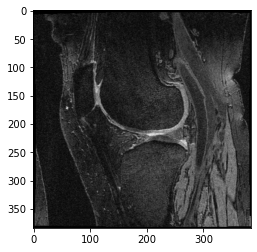

In [33]:
from pydicom.pixel_data_handlers.util import apply_voi_lut

image = apply_voi_lut(ds.pixel_array, ds)
print(np.max(image))
print(np.min(image))

plt.imshow(image, cmap='gray')